In [1]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import numpy as np

import torch
from torch.utils.data import DataLoader
import torch.utils.data as data_utils
from torch.optim import SGD, Adam

import matplotlib.pyplot as plt
# plt.rcParams['figure.facecolor'] = 'white'

from datasets import get_dataset
from loss_fns import get_loss
from utils import solve

torch.set_default_dtype(torch.float64)

%load_ext line_profiler

/home/farshed.abdukhakimov/.conda/envs/sps2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Hutch

In [3]:
def rademacher_old(weights):
    return torch.round(torch.rand_like(weights)) * 2 - 1

def diag_estimate_old(weights, grad, iters):
    Ds = []
    for j in range(iters):
        z = rademacher_old(weights)
        with torch.no_grad():
            hvp = torch.autograd.grad(grad, weights, grad_outputs=z, retain_graph=True)[0]
        Ds.append((hvp*z))

    return torch.mean(torch.stack(Ds), 0)


def precond_smoothing(Dk, alpha=1e-4):
    Dk = torch.abs(Dk)
    Dk[Dk < alpha] = alpha
    return Dk

@torch.no_grad()
def rmsprop_precond(avg, grad, beta=0.99):
    square_avg = torch.square(avg)
    square_avg.mul_(beta).addcmul_(grad, grad, value=1 - beta)   
    Dk = square_avg.sqrt()
    return precond_smoothing(Dk)

@torch.no_grad()
def adagrad_precond(grad):
    Dk = torch.mul(grad, grad).sqrt()
    return precond_smoothing(Dk)    


@torch.no_grad()
def adam_precond(vk_adam, grad, step, beta=0.999):
    vk_adam.add_(beta**(step) * torch.mul(grad, grad))
    t = (1 - beta) / (1 - beta**step)
    Dk_adam = torch.sqrt( t * vk_adam )
    Dk_adam = precond_smoothing(Dk_adam)

    return Dk_adam

# SGD

In [19]:
def train_sgd(dataset_name, percentage, scale, batch_size, loss_name, steps):
    torch.random.manual_seed(0)

    # training 
    loss_class = get_loss(loss_name)
    gamma = 0.1


    scale_range = [-scale, scale] # [-value, value] 
    train_data, train_target = get_dataset(dataset_name, batch_size, percentage, scale_range, loss_class.y_range)
    train_data = train_data.to(torch.get_default_dtype())
    train_target = train_target.to(torch.get_default_dtype())
    train_load = data_utils.TensorDataset(train_data, train_target)
    train_dataloader = DataLoader(train_load, batch_size=batch_size, shuffle=True)

    # parameters
    w = torch.zeros(train_data.shape[1], device=device).requires_grad_()
    loss_function = loss_class(w)

    # save loss and grad size to history
    hist_sgd = []
    loss = loss_function(train_data.to(device), train_target.to(device))
    g, = torch.autograd.grad(loss, w, create_graph=True)
    print(f"Loss: {loss.item()} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")
    hist_sgd.append([loss.item(), (torch.linalg.norm(g) ** 2).item()])

    Dk_hutch = diag_estimate_old(w, g, 100)

    Dk_rmsprop = torch.zeros_like(w)

    Dk_adagrad = torch.zeros_like(w)

    Dk_adam = torch.zeros_like(w)
    vk_adam = torch.zeros_like(w)

    Dk_adahessian = Dk_hutch.detach().clone()
    vk_adahessian = torch.zeros_like(w)


    alpha = 1e-4
    beta=0.999

    cossims = []
    simtys = []
    eucl_dists = []
    pfr_errors = []

    T = np.floor(steps * len(train_data) / batch_size).astype(int)
    step_i = 0

    def simty(v1, v2):
        return torch.linalg.norm( v1/torch.linalg.norm(v1) - v2/torch.linalg.norm(v2) )

    def eucl_dist(v1, v2):
        return torch.sqrt(((v1 - v2)**2).sum())

    def pfr_error(v1, v2):
        return torch.abs((v1 - v2)/v1).sum()


    for step in range(steps):
        for i, (batch_data, batch_target) in enumerate(train_dataloader):

            step_i += 1

            batch_data = batch_data.to(device)
            batch_target = batch_target.to(device)

            for param in w:
                param.grad = None

            loss = loss_function(batch_data, batch_target)

            g, = torch.autograd.grad(loss, w, create_graph=True)

            # Hutch
            vk = diag_estimate_old(w, g, 1)
            Dk_hutch = beta * Dk_hutch + (1 - beta) * vk
            Dk_hutch = precond_smoothing(Dk_hutch)

            # rmsprop
            Dk_rmsprop = rmsprop_precond(Dk_rmsprop, g)

            # adagrad
            Dk_adagrad.add_(adagrad_precond(g))

            # adam
            Dk_adam = adam_precond(vk_adam, g, step_i)
            
            # Dk_hat_inv = 1 / Dk_hat

            with torch.no_grad():
                w.sub_(gamma * g)

        loss = loss_function(train_data.to(device), train_target.to(device))
        g, = torch.autograd.grad(loss, w, create_graph=True)

        def closure(w):
            loss_function = loss_class(w)
            return loss_function(train_data.to(device), train_target.to(device))

        hess = torch.autograd.functional.hessian(closure, w)
        hess_diag = torch.diag(hess)

        # print(torch.abs(hess_diag.sum() - Dk.sum().item()))
        hutch_cs = torch.nn.functional.cosine_similarity(hess_diag, Dk_hutch, dim=0).item()
        rmsprop_cs = torch.nn.functional.cosine_similarity(hess_diag, Dk_rmsprop, dim=0).item()
        adagrad_cs = torch.nn.functional.cosine_similarity(hess_diag, Dk_adagrad, dim=0).item()
        adam_cs = torch.nn.functional.cosine_similarity(hess_diag, Dk_adam, dim=0).item()


        print(f"hutch_cs: {hutch_cs} | rmsprop_cs: {rmsprop_cs} | adagrad_cs: {adagrad_cs} | adam_cs: {adam_cs}")    

        cossims.append([hutch_cs, rmsprop_cs, adagrad_cs, adam_cs])

        # custom similarity measure
        hutch_simty = simty(Dk_hutch, hess_diag).item()
        rmsprop_simty = simty(Dk_rmsprop, hess_diag).item()
        adagrad_simty = simty(Dk_adagrad, hess_diag).item()
        adam_simty = simty(Dk_adam, hess_diag).item()

        simtys.append([hutch_simty, rmsprop_simty, adagrad_simty, adam_simty])


        # eucl dist
        hutch_ed = eucl_dist(Dk_hutch, hess_diag).item()
        rmsprop_ed = eucl_dist(Dk_rmsprop, hess_diag).item()
        adagrad_ed = eucl_dist(Dk_adagrad, hess_diag).item()
        adam_ed = eucl_dist(Dk_adam, hess_diag).item()

        eucl_dists.append([hutch_ed, rmsprop_ed, adagrad_ed, adam_ed])

        # per feature relative error 
        hutch_pfre = pfr_error(Dk_hutch, hess_diag).item()
        rmsprop_pfre = pfr_error(Dk_rmsprop, hess_diag).item()
        adagrad_pfre = pfr_error(Dk_adagrad, hess_diag).item()
        adam_pfre = pfr_error(Dk_adam, hess_diag).item()

        pfr_errors.append([hutch_pfre, rmsprop_pfre, adagrad_pfre, adam_pfre])

        # print(f"Loss: {loss.item()} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")
        hist_sgd.append([loss.item(), (torch.linalg.norm(g) ** 2).item()])


    return [hist_sgd, cossims, simtys, eucl_dists, pfr_errors]

In [22]:
def plot_results(hist_sgd, cossims, simtys, eucl_dists, pfr_errors, label):


    fig, axs = plt.subplots(2, 3, figsize=(28, 8), dpi=200)


    axs[0, 0].semilogy([x[0] for x in hist_sgd])
    axs[0, 1].semilogy([x[1] for x in hist_sgd])


    axs[0, 2].semilogy([x[0] for x in cossims], label="hutch")
    axs[0, 2].semilogy([x[1] for x in cossims], label="rmsprop")
    axs[0, 2].semilogy([x[2] for x in cossims], label="adagrad")
    axs[0, 2].semilogy([x[3] for x in cossims], label="adam")

    axs[1, 0].semilogy([x[0] for x in simtys])
    axs[1, 0].semilogy([x[1] for x in simtys])
    axs[1, 0].semilogy([x[2] for x in simtys])
    axs[1, 0].semilogy([x[3] for x in simtys])

    axs[1, 1].semilogy([x[0] for x in eucl_dists])
    axs[1, 1].semilogy([x[1] for x in eucl_dists])
    axs[1, 1].semilogy([x[2] for x in eucl_dists])
    axs[1, 1].semilogy([x[3] for x in eucl_dists])

    axs[1, 2].semilogy([x[0] for x in pfr_errors])
    axs[1, 2].semilogy([x[1] for x in pfr_errors])
    axs[1, 2].semilogy([x[2] for x in pfr_errors])
    axs[1, 2].semilogy([x[3] for x in pfr_errors])



    axs[0, 0].set_ylabel('loss', fontsize=20)
    axs[0, 1].set_ylabel('GradNorm^2', fontsize=20)
    axs[0, 2].set_ylabel('cossim', fontsize=20)
    axs[1, 0].set_ylabel(r'$\|\| \frac{v1}{\|\|v1\|\|} - \frac{v2}{\|\|v2\|\|} \|\|$', fontsize=20)
    axs[1, 1].set_ylabel('Eucl Dist', fontsize=20)
    axs[1, 2].set_ylabel('pfr_error', fontsize=20)


    fig.text(0.5, 0.04, 'epochs', ha='center', va='center', )
    fig.suptitle(label)
    fig.legend()
    plt.tight_layout()
    fig.show()

    # fig.savefig(f"../plots/psps2_{dataset_name}_logreg_scale:{scale_range}.png")

In [21]:
dataset_name = "colon-cancer"
percentage = 1.0
batch_size = 8
steps = 1000

cc_results_dict = {}
for loss_name in ("logreg", "nllsq"):
    for scale in (0, 3):
        result_key = f"SGD | Dataset: {dataset_name} Scale: {scale} Loss: {loss_name}"
        result = train_sgd(dataset_name, percentage, scale, batch_size, loss_name, steps)
        cc_results_dict.update({result_key: result})

/home/farshed.abdukhakimov/projects/sps2/datasets
Loss: 0.6931471805599453 | GradNorm^2: 25.480627894208755
hutch_cs: 0.6072236043714434 | rmsprop_cs: 0.726725374301741 | adagrad_cs: 0.7277354193277789 | adam_cs: 0.726420280527229
hutch_cs: 0.6775611420379986 | rmsprop_cs: 0.8197845908808497 | adagrad_cs: 0.8222351568424431 | adam_cs: 0.8193583855391575
hutch_cs: 0.7063282308856136 | rmsprop_cs: 0.8556700876725797 | adagrad_cs: 0.8612560921357441 | adam_cs: 0.8552650327745859
hutch_cs: 0.6976047266090716 | rmsprop_cs: 0.8316083659666239 | adagrad_cs: 0.8377477333310339 | adam_cs: 0.8315116593647764
hutch_cs: 0.6867721852587193 | rmsprop_cs: 0.8148704351105237 | adagrad_cs: 0.8168610865024029 | adam_cs: 0.8154908583332584
hutch_cs: 0.597647010899145 | rmsprop_cs: 0.7396121211496163 | adagrad_cs: 0.7504182102889284 | adam_cs: 0.7386537289503047
hutch_cs: 0.7336377011561422 | rmsprop_cs: 0.8965522437478036 | adagrad_cs: 0.9006885580283139 | adam_cs: 0.8958788561514941
hutch_cs: 0.73628860

/tmp/ipykernel_1319274/3064663149.py:44: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.tight_layout()


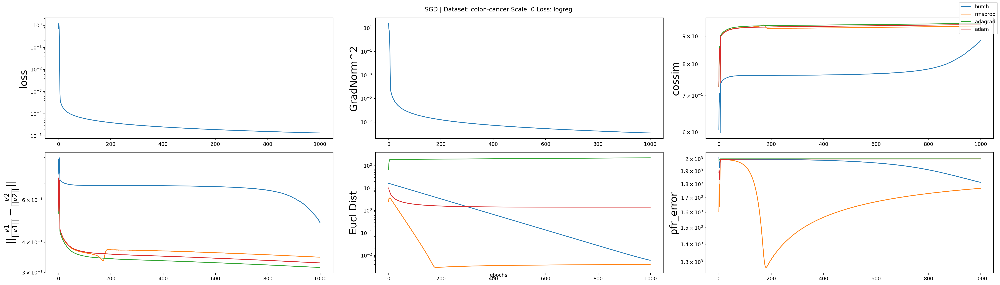

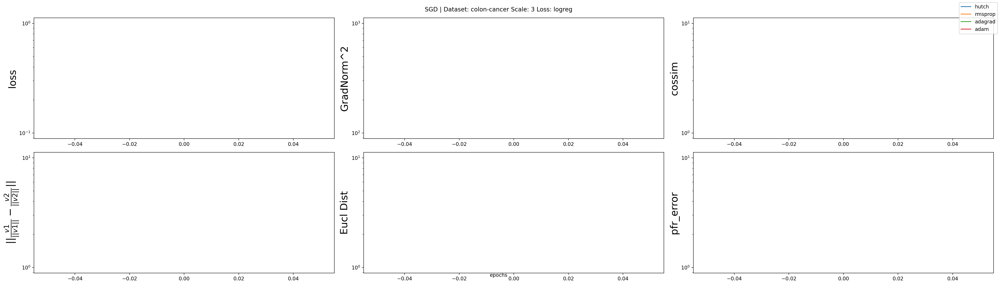

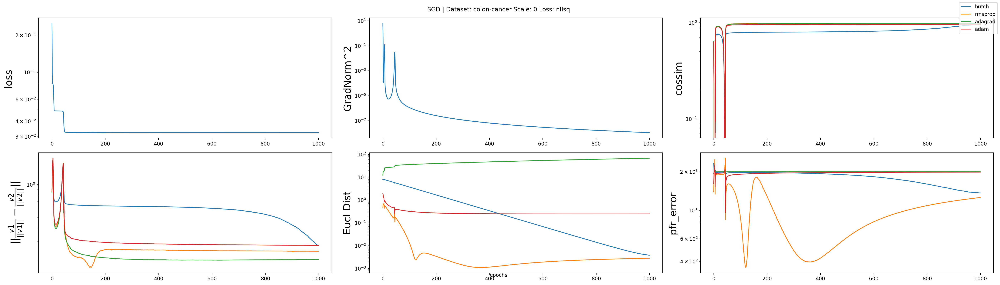

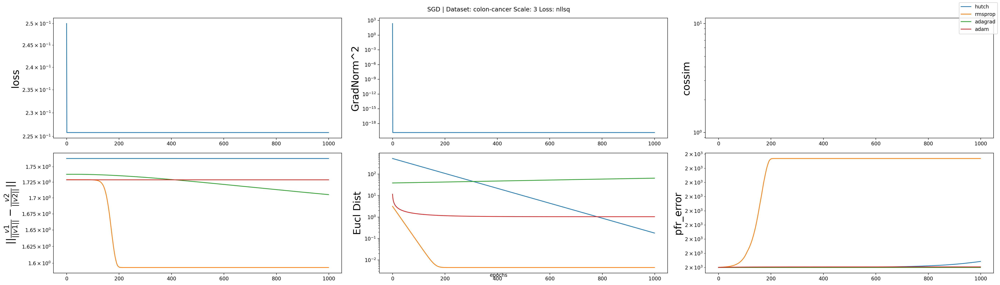

In [23]:
dataset_name = "colon-cancer"
percentage = 1.0
batch_size = 8
steps = 1000

for loss_name in ("logreg", "nllsq"):
    for scale in (0, 3):
        result_key = f"SGD | Dataset: {dataset_name} Scale: {scale} Loss: {loss_name}"
        hist_sgd, cossims, simtys, eucl_dists, pfr_errors =  cc_results_dict[result_key]
        plot_results(hist_sgd, cossims, simtys, eucl_dists, pfr_errors, result_key)

In [24]:
dataset_name = "mushrooms"
percentage = 1.0
batch_size = 64
steps = 500

mushrooms_results_dict = {}
for loss_name in ("logreg", "nllsq"):
    for scale in (0, 3):
        result_key = f"SGD | Dataset: {dataset_name} Scale: {scale} Loss: {loss_name}"
        result = train_sgd(dataset_name, percentage, scale, batch_size, loss_name, steps)
        mushrooms_results_dict.update({result_key: result})

/home/farshed.abdukhakimov/projects/sps2/datasets
Loss: 0.6931471805599454 | GradNorm^2: 0.3195669607542957
hutch_cs: 0.9469446502975102 | rmsprop_cs: 0.8313887225979996 | adagrad_cs: 0.8073673563390427 | adam_cs: 0.812411630802434
hutch_cs: 0.9435847072316926 | rmsprop_cs: 0.8735755663799623 | adagrad_cs: 0.842516446542367 | adam_cs: 0.8278365398579153
hutch_cs: 0.9418022841668345 | rmsprop_cs: 0.9030873070630792 | adagrad_cs: 0.8650983529801384 | adam_cs: 0.8372075186899719
hutch_cs: 0.9416247537213753 | rmsprop_cs: 0.9128819216148126 | adagrad_cs: 0.8766167139259434 | adam_cs: 0.8419807122972964
hutch_cs: 0.9430886269270006 | rmsprop_cs: 0.9067673711392389 | adagrad_cs: 0.8855598663336899 | adam_cs: 0.845578920004812
hutch_cs: 0.9451592519380807 | rmsprop_cs: 0.9135828657338521 | adagrad_cs: 0.8929568401074984 | adam_cs: 0.8493050402819038
hutch_cs: 0.9486441993008647 | rmsprop_cs: 0.9157740812749012 | adagrad_cs: 0.8986889293590673 | adam_cs: 0.8519781970671655
hutch_cs: 0.94979336

In [31]:
0.99**300

0.04904089407128572

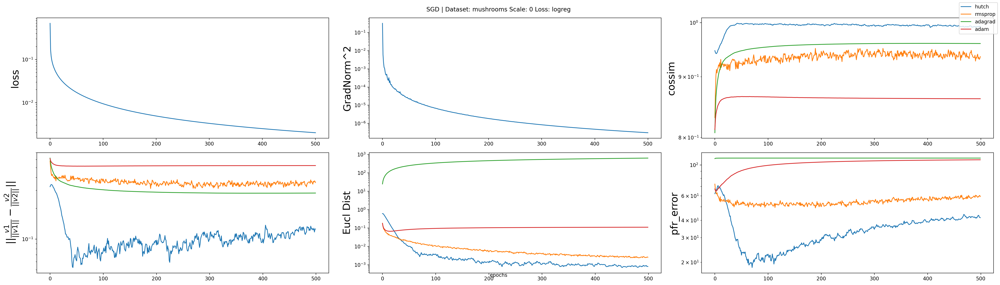

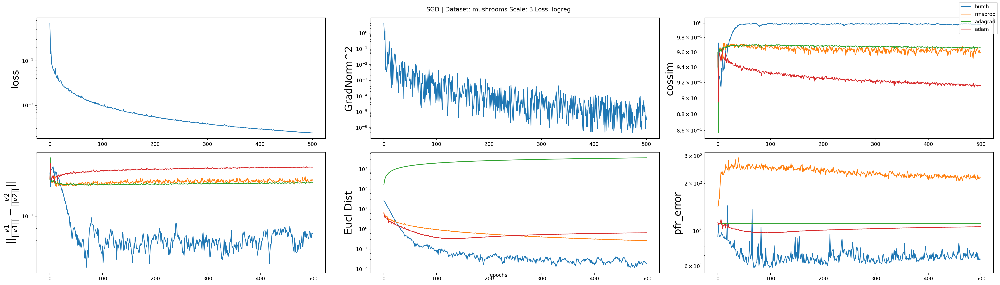

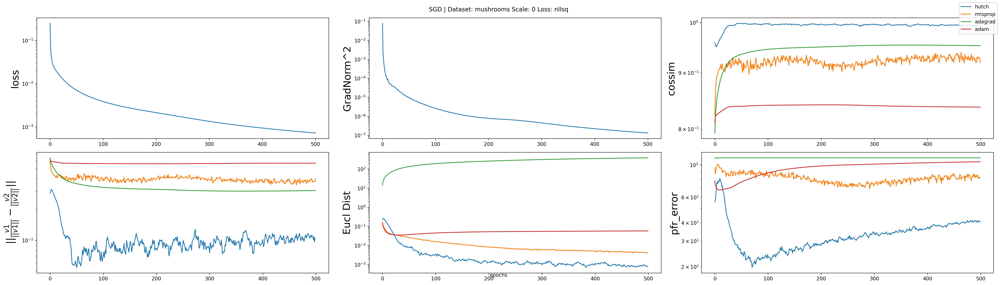

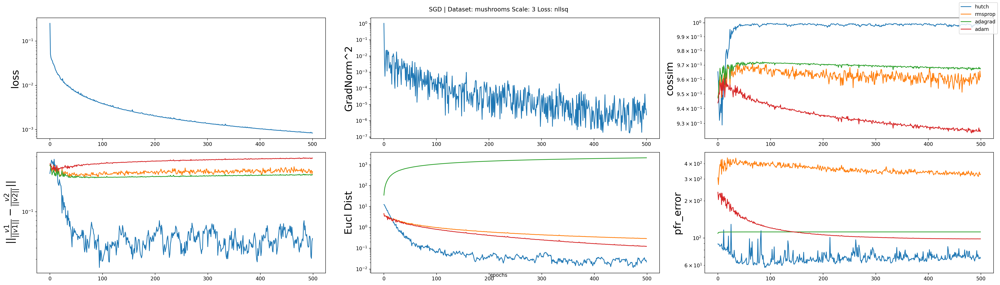

In [25]:
dataset_name = "mushrooms"
percentage = 1.0
batch_size = 64
steps = 500

for loss_name in ("logreg", "nllsq"):
    for scale in (0, 3):
        result_key = f"SGD | Dataset: {dataset_name} Scale: {scale} Loss: {loss_name}"
        hist_sgd, cossims, simtys, eucl_dists, pfr_errors =  mushrooms_results_dict[result_key]
        plot_results(hist_sgd, cossims, simtys, eucl_dists, pfr_errors, result_key)


# decrease lr by 10 run 10x

/home/farshed.abdukhakimov/projects/sps2/datasets
Loss: 0.6931471805599453 | GradNorm^2: 0.4539661151672873
hutch_cs: 0.97265681490055 | rmsprop_cs: 0.9064837841625263 | adagrad_cs: 0.8545122841997966 | adam_cs: 0.9135024002632329
hutch_cs: 0.9686920973225859 | rmsprop_cs: 0.8830314680699424 | adagrad_cs: 0.8332975424696323 | adam_cs: 0.8967572021728386
hutch_cs: 0.9695043909442331 | rmsprop_cs: 0.8758883710532437 | adagrad_cs: 0.834507384530874 | adam_cs: 0.8915290019203291
hutch_cs: 0.971039195085727 | rmsprop_cs: 0.8800522833071435 | adagrad_cs: 0.8401387813419698 | adam_cs: 0.890022395312994
hutch_cs: 0.9714508846150249 | rmsprop_cs: 0.8867743308705055 | adagrad_cs: 0.8460203623138426 | adam_cs: 0.8898120282047677
hutch_cs: 0.973526784895507 | rmsprop_cs: 0.8810312833353358 | adagrad_cs: 0.8487931634665187 | adam_cs: 0.8889419158372749
hutch_cs: 0.9757855957962717 | rmsprop_cs: 0.8855919509653033 | adagrad_cs: 0.8536174317188562 | adam_cs: 0.8891794946789064
hutch_cs: 0.97713310982

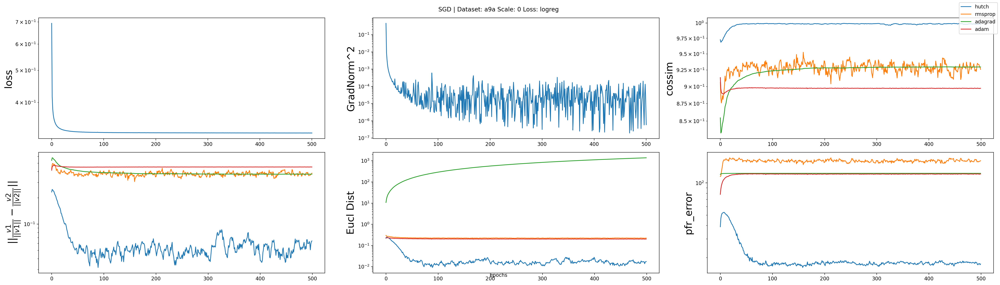

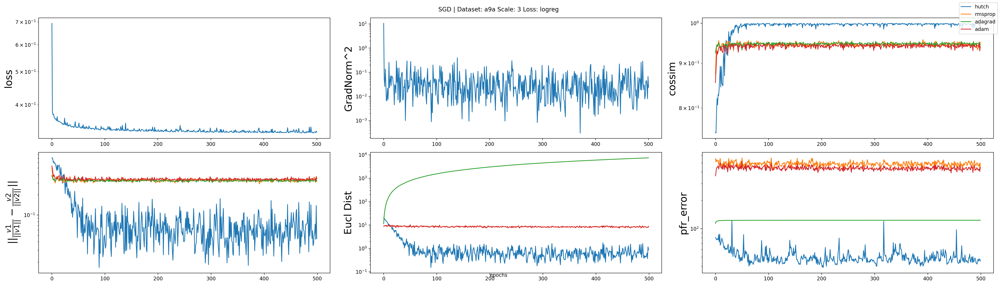

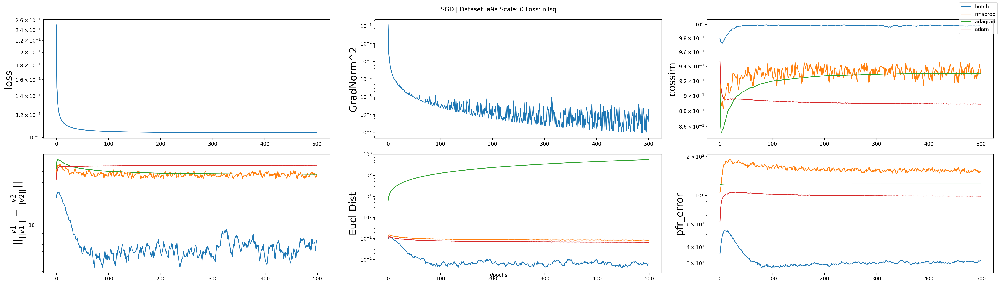

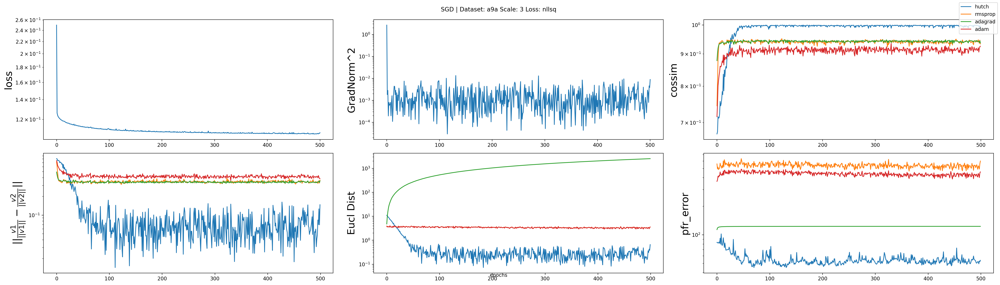

In [27]:
dataset_name = "a9a"
percentage = 1.0
batch_size = 512
steps = 500

a9a_results_dict = {}
for loss_name in ("logreg", "nllsq"):
    for scale in (0, 3):
        result_key = f"SGD | Dataset: {dataset_name} Scale: {scale} Loss: {loss_name}"
        result = train_sgd(dataset_name, percentage, scale, batch_size, loss_name, steps)
        a9a_results_dict.update({result_key: result})

for loss_name in ("logreg", "nllsq"):
    for scale in (0, 3):
        result_key = f"SGD | Dataset: {dataset_name} Scale: {scale} Loss: {loss_name}"
        hist, cossims, simtys, eucl_dists, pfr_errors =  a9a_results_dict[result_key]
        plot_results(hist, cossims, simtys, eucl_dists, pfr_errors, result_key)

In [30]:

def pfr_error(v1, v2):
    sum_ = 0.0
    for x, y in zip(v1, v2):
        sum_ += torch.abs((x - y)/x)
    return sum_

def prf_error2(v1, v2):
    return torch.abs((v1 - v2)/v1).sum()

# a = torch.asarray([100, 2, 3], dtype=float)
# b = torch.asarray([105, 0, 0], dtype=float)
# c = torch.asarray([106, 2, 3], dtype=float)

a = torch.rand(100000, dtype=float)
b = torch.rand(100000, dtype=float)
c = torch.rand(100000, dtype=float)

%timeit pfr_error(a, b)

1.09 s ± 25.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [24]:
# Setup
batch_size = 64
dataset_name = "mushrooms"
percentage = 1.0

# training 
STEPS = 100
loss_class = get_loss("logreg")
gamma = 0.1

torch.random.manual_seed(0)

scale_range = None # [-value, value]
train_data, train_target = get_dataset(dataset_name, batch_size, percentage, scale_range, loss_class.y_range)

X = torch.cat((train_data, train_data, train_data))
Y = torch.cat((train_target, train_target, -train_target))

# X = train_data
# Y = train_target

train_data = X.to(torch.get_default_dtype())
train_target = Y.to(torch.get_default_dtype())
train_load = data_utils.TensorDataset(train_data, train_target)
train_dataloader = DataLoader(train_load, batch_size=batch_size, shuffle=True)

train_data = train_data.numpy()
train_target = train_target.numpy()

/home/farshed.abdukhakimov/projects/sps2/datasets


In [25]:
def log_reg(w, X, y):
    return torch.mean(torch.log(1 + torch.exp(-y * (X @ w))))

def logreg_np(w, X, y):
    r = -y*X.dot(w)
    expr = np.exp(r)
    return np.mean(np.log(1+expr))  

def grad_log_reg(w, X, y):
    r = torch.exp(-y * (X @ w))
    return ( (r/(1 + r)) @ (X * -y[:, None]) ) / X.shape[0]

def grad_np(w, X, y):
    r = -y*X.dot(w)
    expr = np.exp(r)
    grad= X.T.dot(-expr/(1+expr)*y)   
    return grad / X.shape[0]   

def hess_log_reg(w, X, y):
    r = torch.exp(-y * (X @ w))
    return ( X.T @ (  (r/torch.square(1 + r)).reshape(-1, 1) * X ) ) / X.shape[0]


def hess_np(w, X, y):
    r = np.exp(-y*X.dot(w))
    return ( X.T.dot( (r/np.square(1 + r)).reshape(-1, 1) * X ) ) / X.shape[0] 

In [26]:
# parameters
w = np.zeros(train_data.shape[1])

loss_function = logreg_np
loss_grad = grad_np
loss_hess = hess_np

# save loss and grad size to history
hist_sgd = []
loss = loss_function(w, train_data, train_target)

print(loss)

g = loss_grad(w, train_data, train_target)

print(g.shape)

hess = loss_hess(w, train_data, train_target)

print(hess.shape)

print(f"Loss: {loss.item()} | GradNorm^2: {(np.linalg.norm(g) ** 2 ).item()}")
hist_sgd.append([loss.item(), (np.linalg.norm(g) ** 2).item()])

gamma = 0.1

for step in range(100):
    for i, (batch_data, batch_target) in enumerate(train_dataloader):
        batch_data = batch_data.numpy()
        batch_target = batch_target.numpy()

        loss = loss_function(w, batch_data, batch_target)

        g = loss_grad(w, batch_data, batch_target)

        hess = loss_hess(w, batch_data, batch_target)

        w = w - (gamma * g)

    loss = loss_function(w, train_data, train_target)
    g = loss_grad(w, train_data, train_target)

    hess = loss_hess(w, train_data, train_target)
    # hess_diag = torch.diag(hess)

    print(f"Loss: {loss} | GradNorm^2: {(np.linalg.norm(g) ** 2 )}")
    hist_sgd.append([loss, (np.linalg.norm(g) ** 2)])

0.6931471805599453
(112,)
(112, 112)
Loss: 0.6931471805599453 | GradNorm^2: 0.3195669607542956
Loss: 0.16688126373158887 | GradNorm^2: 0.006452639256194544
Loss: 0.12060515979066042 | GradNorm^2: 0.0026588611312482187
Loss: 0.09959597024677283 | GradNorm^2: 0.001209466815461525
Loss: 0.08710466612441846 | GradNorm^2: 0.0008769331764005378
Loss: 0.07814289228341544 | GradNorm^2: 0.0006199414735045726
Loss: 0.0712692961187481 | GradNorm^2: 0.00048072931188238965
Loss: 0.06577270204050176 | GradNorm^2: 0.0004237611114677346
Loss: 0.06113223847630964 | GradNorm^2: 0.0003367449314634618
Loss: 0.05721009049748526 | GradNorm^2: 0.0002951859188615976
Loss: 0.0538093592127344 | GradNorm^2: 0.0002522537996804041
Loss: 0.050936882957876385 | GradNorm^2: 0.00029141312429417204
Loss: 0.04826299580607136 | GradNorm^2: 0.00023361059240277645
Loss: 0.04585419432278815 | GradNorm^2: 0.0001746545488736032
Loss: 0.04375674427662023 | GradNorm^2: 0.00016517462689018484
Loss: 0.04183880042358908 | GradNorm

In [26]:
a = torch.rand((120))
b = torch.rand((120, 50))


(b.T @ b).shape

torch.Size([50, 50])